# Hematopoiesis - DPT

Construct diffusion pseudotime on NeurIPS 2021 hematopoiesis data.

In [1]:
import os
import sys

import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import mplscience
import seaborn as sns

import cellrank as cr
import scanpy as sc
import scvelo as scv
from anndata import AnnData

from cr2 import get_state_purity, plot_state_purity, plot_states, running_in_notebook

sys.path.extend(["../../../", "."])
from paths import DATA_DIR, FIG_DIR  # isort: skip  # noqa: E402

Global seed set to 0


## General settings

In [2]:
sc.settings.verbosity = 2
cr.settings.verbosity = 4
scv.settings.verbosity = 3

In [3]:
scv.settings.set_figure_params("scvelo", dpi_save=400, dpi=80, transparent=True, fontsize=20, color_map="viridis")

In [4]:
SAVE_FIGURES = False
if SAVE_FIGURES:
    os.makedirs(FIG_DIR / "pseudotime_kernel" / "hematopoiesis", exist_ok=True)
FIGURE_FORMAT = "pdf"

In [5]:
os.makedirs(DATA_DIR / "hematopoiesis" / "results", exist_ok=True)

## Constants

In [6]:
CELLTYPES_TO_KEEP = [
    "HSC",
    "MK/E prog",
    "Proerythroblast",
    "Erythroblast",
    "Normoblast",
    "cDC2",
    "pDC",
    "G/M prog",
    "CD14+ Mono",
]

## Data loading

In [7]:
adata = sc.read(DATA_DIR / "hematopoiesis" / "processed" / "gex_preprocessed.h5ad")
adata

AnnData object with n_obs × n_vars = 67568 × 25629
    obs: 'site', 'donor', 'batch', 'l1_cell_type', 'l2_cell_type'
    var: 'hvg_multiVI'
    uns: 'neighbors', 'umap'
    obsm: 'MultiVI_latent', 'X_umap'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

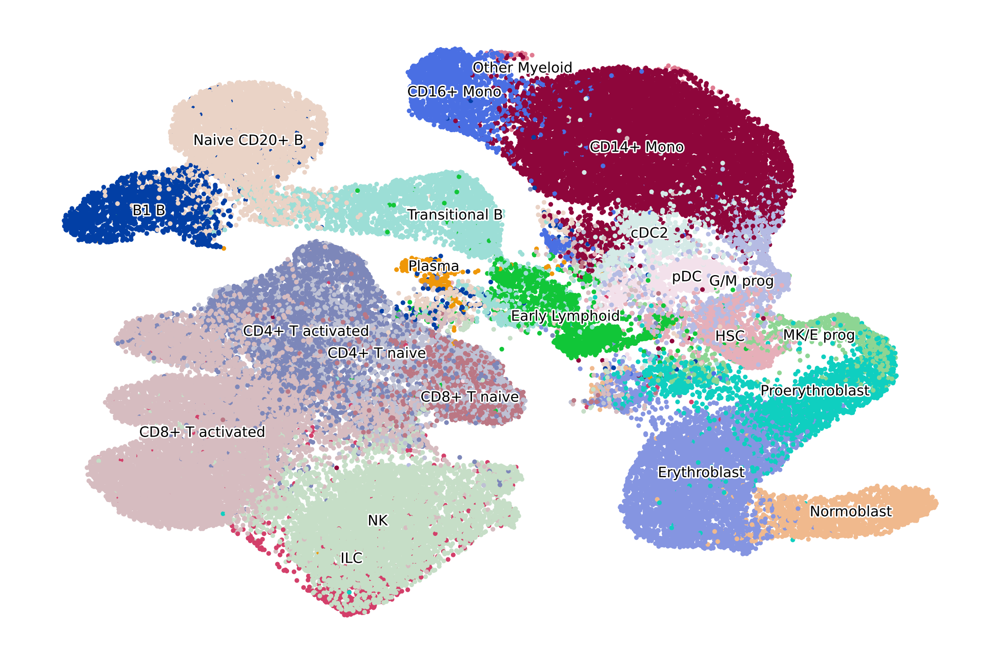

In [8]:
if running_in_notebook():
    scv.pl.scatter(adata, basis="X_umap", c="l2_cell_type", dpi=200, title="", legend_fontsize=5, legend_fontweight=1)

if SAVE_FIGURES:
    fig, ax = plt.subplots(figsize=(6, 4))

    scv.pl.scatter(adata, basis="X_umap", c="l2_cell_type", legend_loc="none", title="", ax=ax)

    fig.savefig(
        FIG_DIR / "pseudotime_kernel" / "hematopoiesis" / "umap_colored_by_l2_cell_type_full_data.eps",
        format="eps",
        transparent=True,
        bbox_inches="tight",
    )

## Data preprocessing

In [9]:
adata = adata[adata.obs["l2_cell_type"].isin(CELLTYPES_TO_KEEP), :].copy()
adata

AnnData object with n_obs × n_vars = 24440 × 25629
    obs: 'site', 'donor', 'batch', 'l1_cell_type', 'l2_cell_type'
    var: 'hvg_multiVI'
    uns: 'neighbors', 'umap', 'l2_cell_type_colors'
    obsm: 'MultiVI_latent', 'X_umap'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

In [10]:
sc.pp.neighbors(adata, use_rep="MultiVI_latent")
sc.tl.umap(adata)

computing neighbors
    finished (0:02:26)
computing UMAP
    finished (0:00:10)


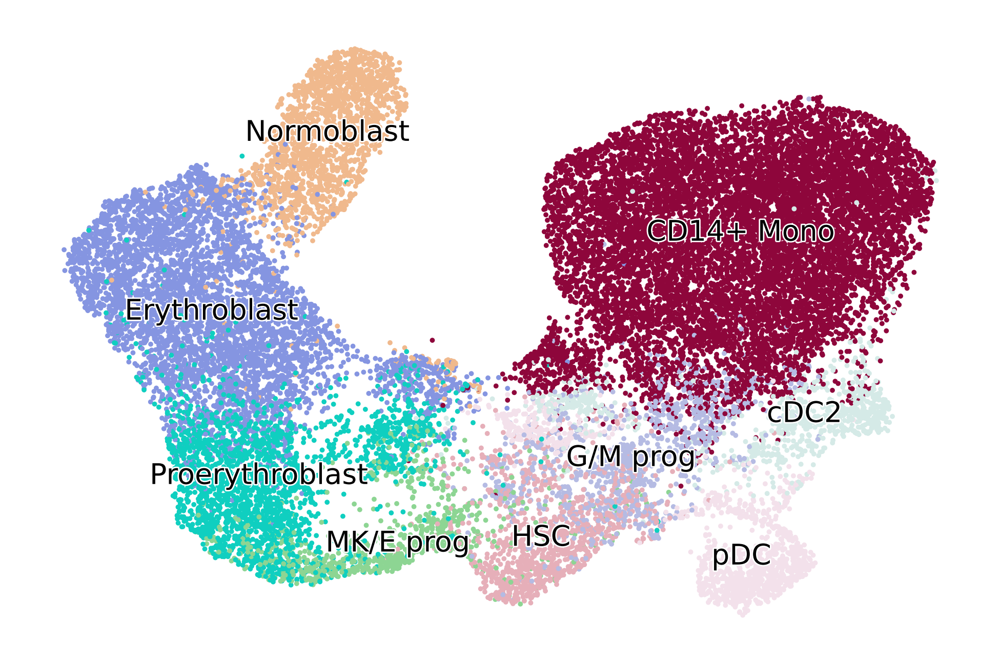

In [11]:
if running_in_notebook():
    scv.pl.scatter(
        adata,
        basis="X_umap",
        c="l2_cell_type",
        dpi=200,
        title="",
        legend_fontsize=10,
        legend_fontweight=5,
    )

if SAVE_FIGURES:
    fig, ax = plt.subplots(figsize=(6, 4))
    scv.pl.scatter(adata, basis="X_umap", c="l2_cell_type", legend_loc="none", title="", ax=ax)

    fig.savefig(
        FIG_DIR / "pseudotime_kernel" / "hematopoiesis" / "umap_colored_by_l2_cell_type_subsetted_data.eps",
        format="eps",
        transparent=True,
        bbox_inches="tight",
    )

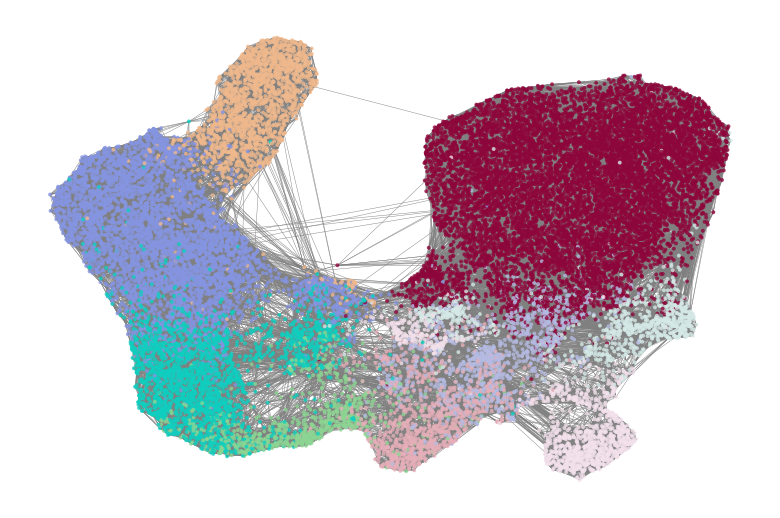

In [12]:
if running_in_notebook():
    fig, ax = plt.subplots(figsize=(6, 4))
    scv.pl.velocity_graph(
        adata, basis="umap", which_graph="connectivities", color="l2_cell_type", legend_loc=False, title="", ax=ax
    )

if SAVE_FIGURES:
    fig.savefig(
        FIG_DIR / "pseudotime_kernel" / "hematopoiesis" / "umap_with_knn_graph.pdf",
        format="pdf",
        transparent=True,
        bbox_inches="tight",
        dpi=400,
    )

## Diffusion pseudotime

In [13]:
sc.tl.diffmap(adata, n_comps=15)

computing Diffusion Maps using n_comps=15(=n_dcs)
computing transitions
    finished (0:00:00)
    eigenvalues of transition matrix
    [1.         0.99922997 0.9977195  0.9968419  0.9955766  0.9942717
     0.9900949  0.9884704  0.9867782  0.9852537  0.9849594  0.9830871
     0.98229724 0.9809607  0.97756666]
    finished (0:00:00)


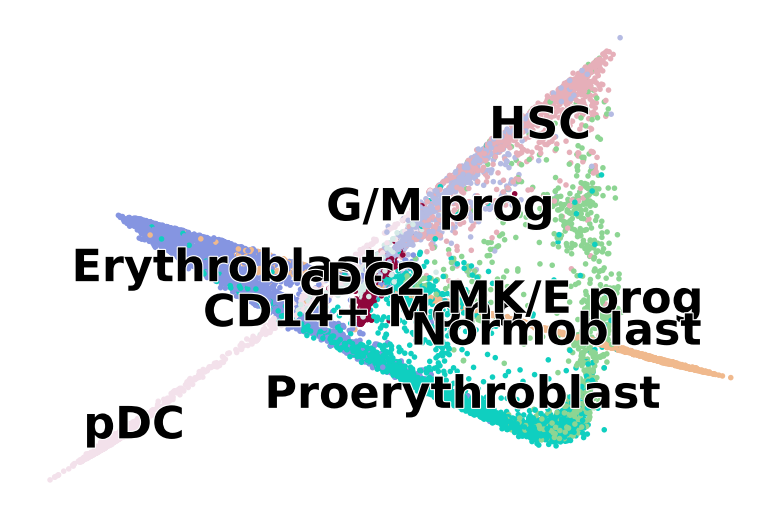

In [14]:
if running_in_notebook():
    fig, ax = plt.subplots(figsize=(6, 4))
    scv.pl.scatter(
        adata, basis="diffmap", color=["l2_cell_type"], components=["4, 5"], size=25, dpi=100, title="", ax=ax
    )

    if SAVE_FIGURES:
        fig, ax = plt.subplots(figsize=(6, 4))
        scv.pl.scatter(
            adata, basis="diffmap", color=["l2_cell_type"], components=["4, 5"], title="", legend_loc=False, ax=ax
        )

        fig.savefig(
            FIG_DIR / "pseudotime_kernel" / "hematopoiesis" / "diffmap_dc4_vs_dc5_colored_by_celltype.eps",
            format="eps",
            transparent=True,
            bbox_inches="tight",
        )

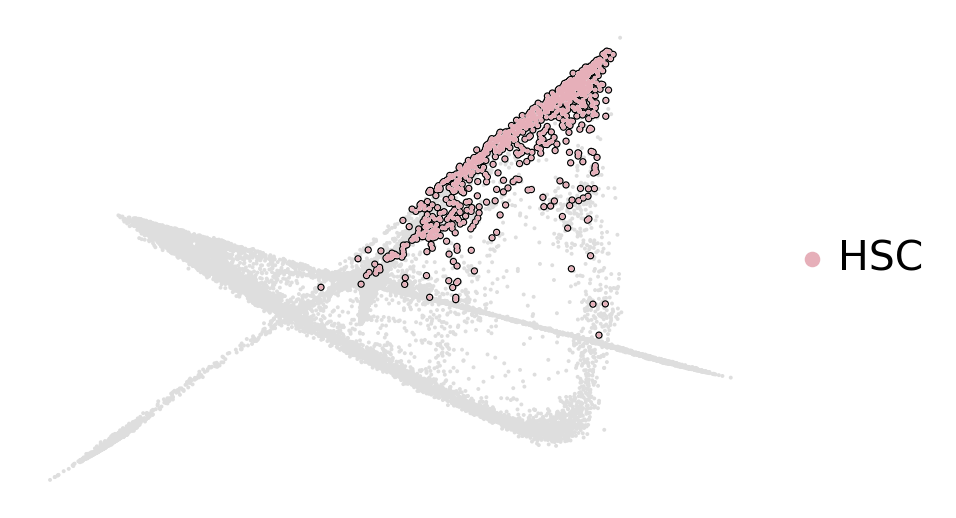

In [15]:
adata.obs["hsc_cluster"] = (
    adata.obs["l2_cell_type"]
    .astype("str")
    .replace(
        {
            "MK/E prog": "nan",
            "Proerythroblast": "nan",
            "Erythroblast": "nan",
            "Normoblast": "nan",
            "cDC2": "nan",
            "pDC": "nan",
            "G/M prog": "nan",
            "CD14+ Mono": "nan",
        }
    )
    .astype("category")
    .cat.reorder_categories(["nan", "HSC"])
    .copy()
)

celltype_colors = dict(zip(adata.obs["l2_cell_type"].cat.categories, adata.uns["l2_cell_type_colors"]))
adata.uns["hsc_cluster_colors"] = ["#dedede", celltype_colors["HSC"]]

if running_in_notebook():
    fig, ax = plt.subplots(figsize=(6, 4))
    scv.pl.scatter(
        adata,
        basis="diffmap",
        c=["hsc_cluster"],
        legend_loc="right",
        components=["4, 5"],
        add_outline="HSC",
        title="",
        ax=ax,
    )

if SAVE_FIGURES:
    fig, ax = plt.subplots(figsize=(6, 4))
    scv.pl.scatter(
        adata,
        basis="diffmap",
        c=["hsc_cluster"],
        legend_loc=False,
        components=["4, 5"],
        add_outline="HSC",
        title="",
        ax=ax,
    )

    fig.savefig(
        FIG_DIR / "pseudotime_kernel" / "hematopoiesis" / "diffmap_dc4_vs_dc5_hsc_outlined.pdf",
        format="pdf",
        transparent=True,
        bbox_inches="tight",
        dpi=400,
    )

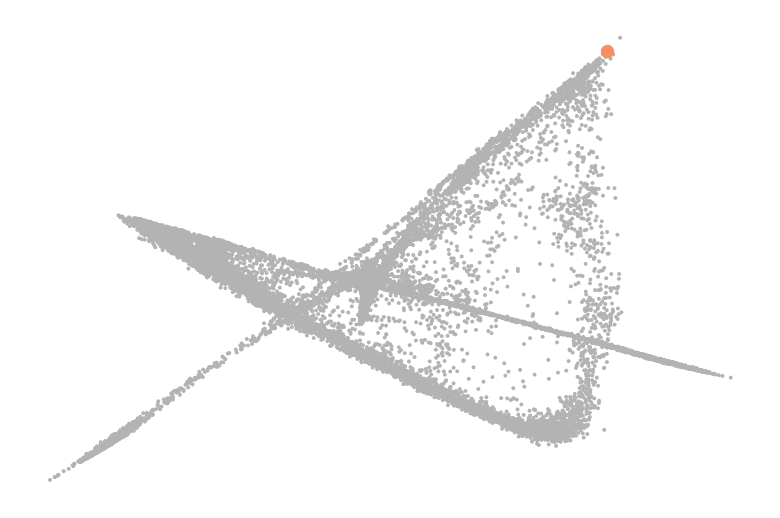

In [16]:
df = (
    pd.DataFrame(
        {
            "diff_comp": adata.obsm["X_diffmap"][:, 5],
            "cell_type": adata.obs["l2_cell_type"].values,
        }
    )
    .reset_index()
    .rename({"index": "obs_id"}, axis=1)
)
df = df.loc[df["cell_type"] == "HSC", "diff_comp"]
root_idx = df.index[df.argmax()]

set2_cmap = sns.color_palette("Set2").as_hex()
palette = [set2_cmap[-1], set2_cmap[1]]

if running_in_notebook():
    fig, ax = plt.subplots(figsize=(6, 4))
    scv.pl.scatter(adata, basis="diffmap", c=root_idx, legend_loc=False, palette=palette, components=["4, 5"], ax=ax)

    if SAVE_FIGURES:
        fig.savefig(
            FIG_DIR / "pseudotime_kernel" / "hematopoiesis" / "diffmap_dc4_vs_dc5_pseudotime_root_id.eps",
            format="pdf",
            transparent=True,
            bbox_inches="tight",
        )

In [17]:
adata.uns["iroot"] = root_idx
sc.tl.dpt(adata, n_dcs=6)

computing Diffusion Pseudotime using n_dcs=6
    finished (0:00:00)


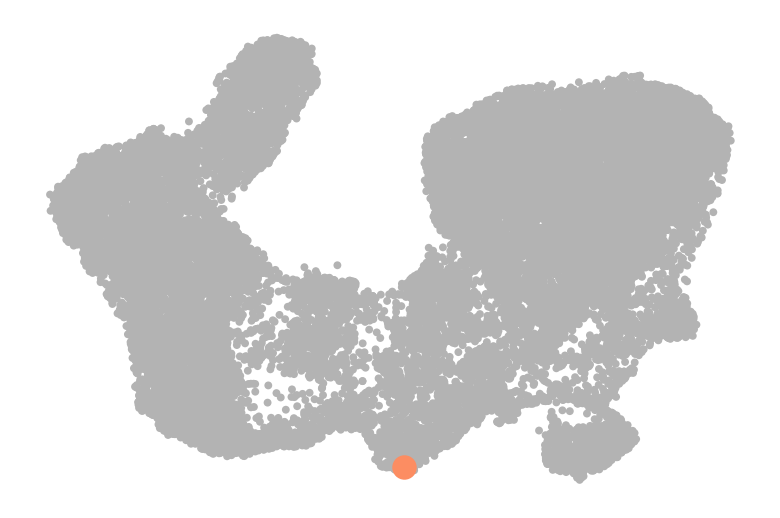

In [18]:
if running_in_notebook():
    fig, ax = plt.subplots(figsize=(6, 4))
    scv.pl.scatter(adata, basis="umap", color=root_idx, palette=palette, color_map="viridis", size=50, ax=ax)

    if SAVE_FIGURES:
        fig.savefig(
            FIG_DIR / "pseudotime_kernel" / "hematopoiesis" / "umap_pseudotime_root_id.eps",
            format="eps",
            transparent=True,
            bbox_inches="tight",
        )

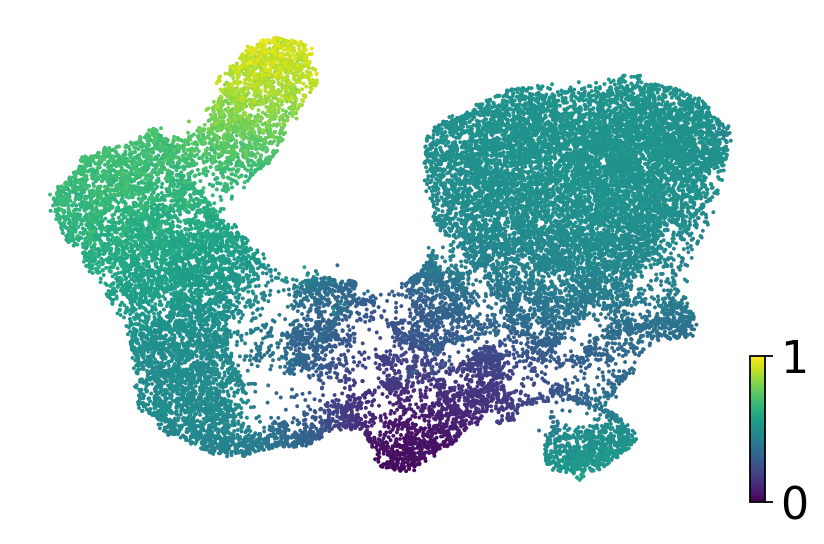

In [19]:
if running_in_notebook():
    fig, ax = plt.subplots(figsize=(6, 4))
    scv.pl.scatter(adata, basis="umap", color="dpt_pseudotime", title="", color_map="viridis", ax=ax)

if SAVE_FIGURES:
    fig, ax = plt.subplots(figsize=(6, 4))
    scv.pl.scatter(adata, basis="umap", color="dpt_pseudotime", title="", color_map="viridis", colorbar=False, ax=ax)

    fig.savefig(
        FIG_DIR / "pseudotime_kernel" / "hematopoiesis" / "umap_colored_by_dpt_pseudotime.eps",
        format="eps",
        transparent=True,
        bbox_inches="tight",
    )

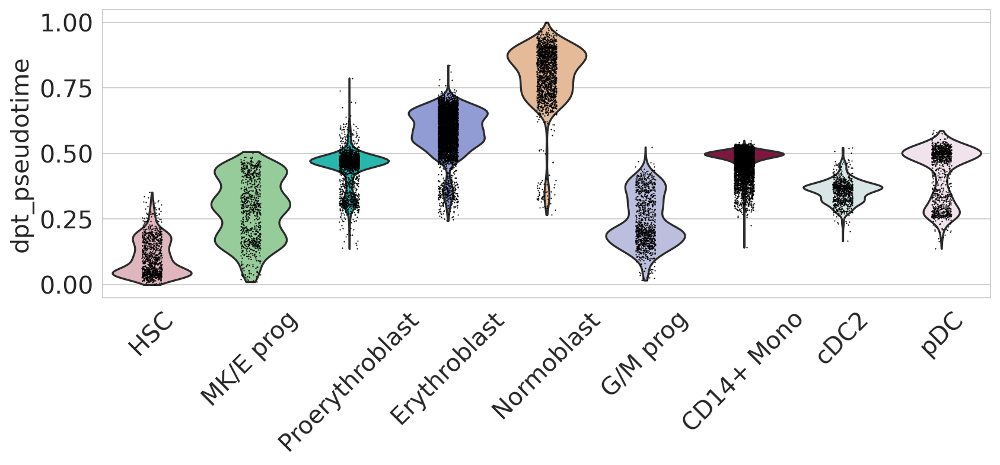

In [20]:
if running_in_notebook():
    sns.set_style(style="whitegrid")
    fig, ax = plt.subplots(figsize=(12, 4))
    sc.pl.violin(
        adata,
        keys=["dpt_pseudotime"],
        groupby="l2_cell_type",
        rotation=45,
        title="",
        legend_loc="none",
        order=[
            "HSC",
            "MK/E prog",
            "Proerythroblast",
            "Erythroblast",
            "Normoblast",
            "G/M prog",
            "CD14+ Mono",
            "cDC2",
            "pDC",
        ],
        ax=ax,
    )

    sns.reset_orig()

if SAVE_FIGURES:
    sns.set_style(style="whitegrid")
    fig, ax = plt.subplots(figsize=(12, 4))
    sc.pl.violin(
        adata,
        keys=["dpt_pseudotime"],
        groupby="l2_cell_type",
        rotation=45,
        title="",
        legend_loc="none",
        order=[
            "HSC",
            "MK/E prog",
            "Proerythroblast",
            "Erythroblast",
            "Normoblast",
            "G/M prog",
            "CD14+ Mono",
            "cDC2",
            "pDC",
        ],
        ax=ax,
    )
    ax.set(xlabel=None, xticklabels=[], ylabel=None, yticklabels=[])

    sns.reset_orig()

    fig.savefig(
        FIG_DIR / "pseudotime_kernel" / "hematopoiesis" / "dpt_per_cell_type.eps",
        format="eps",
        transparent=True,
        bbox_inches="tight",
    )

## CellRank

### Kernel

In [21]:
ptk = cr.kernels.PseudotimeKernel(adata, time_key="dpt_pseudotime").compute_transition_matrix(threshold_scheme="soft")

Computing transition matrix based on pseudotime


  0%|          | 0/24440 [00:00<?, ?cell/s]

    Finish (0:00:09)


Projecting transition matrix onto `umap`
Adding `adata.obsm['T_fwd_umap']`
    Finish (0:00:07)


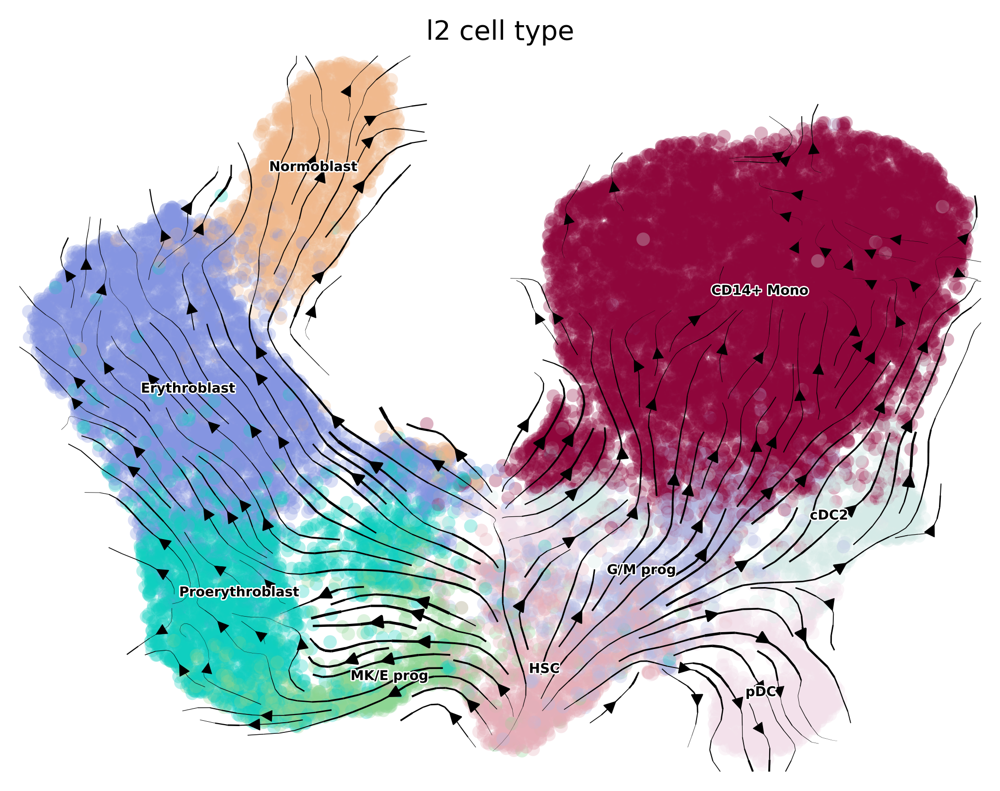

In [22]:
if running_in_notebook():
    ptk.plot_projection(color="l2_cell_type", recompute=True, basis="X_umap", dpi=200, legend_fontsize=5)

    if SAVE_FIGURES:
        fig, ax = plt.subplots(figsize=(6, 4))
        ptk.plot_projection(
            color="l2_cell_type",
            recompute=True,
            basis="X_umap",
            title="",
            legend_loc="none",
            alpha=0.25,
            linewidth=2,
            ax=ax,
        )

        fig.savefig(
            FIG_DIR / "pseudotime_kernel" / "hematopoiesis" / "dpt_stream.png",
            format="png",
            transparent=True,
            bbox_inches="tight",
            dpi=400,
        )

### Estimator

Computing Schur decomposition
Adding `adata.uns['eigendecomposition_fwd']`
       `.schur_vectors`
       `.schur_matrix`
       `.eigendecomposition`
    Finish (0:00:01)


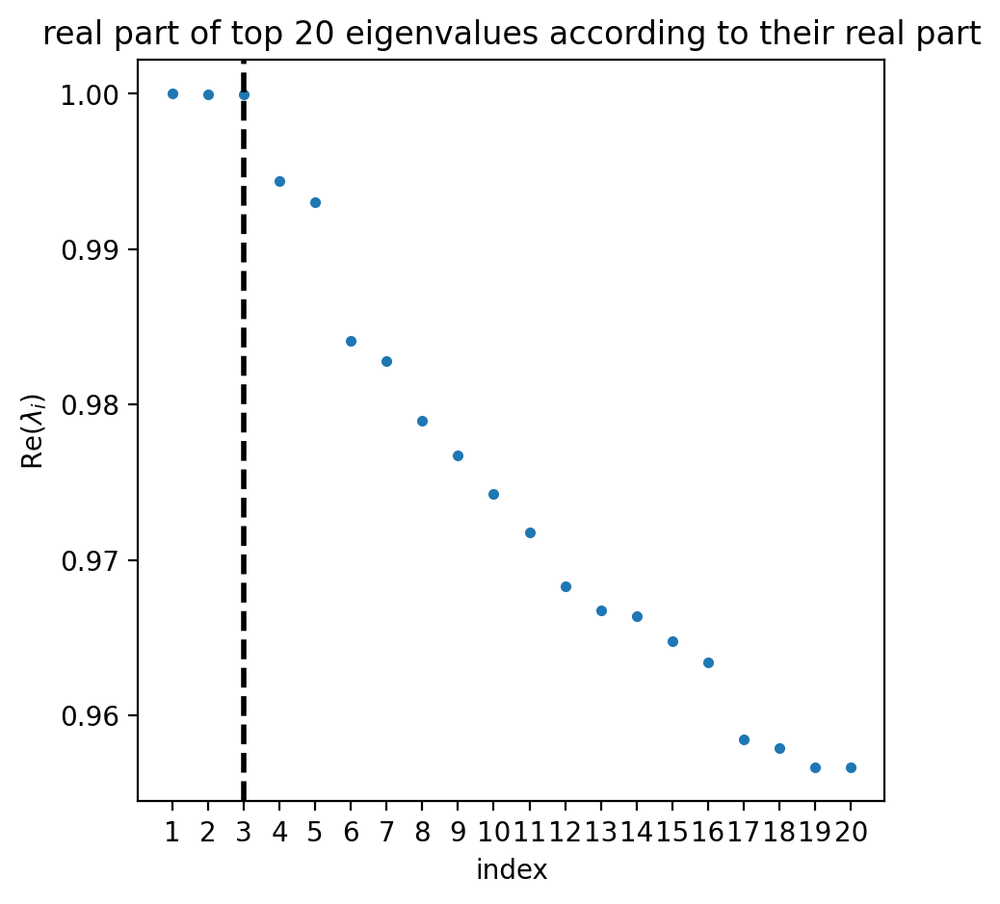

In [23]:
estimator = cr.estimators.GPCCA(ptk)
estimator.compute_schur(n_components=20)
estimator.plot_spectrum(real_only=True)
plt.show()

Computing `3` macrostates
DEBUG: Setting the macrostates using macrostates memberships
DEBUG: Raising an exception if there are less than `6` cells.
Adding `.macrostates`
       `.macrostates_memberships`
       `.coarse_T`
       `.coarse_initial_distribution
       `.coarse_stationary_distribution`
       `.schur_vectors`
       `.schur_matrix`
       `.eigendecomposition`
    Finish (0:00:00)


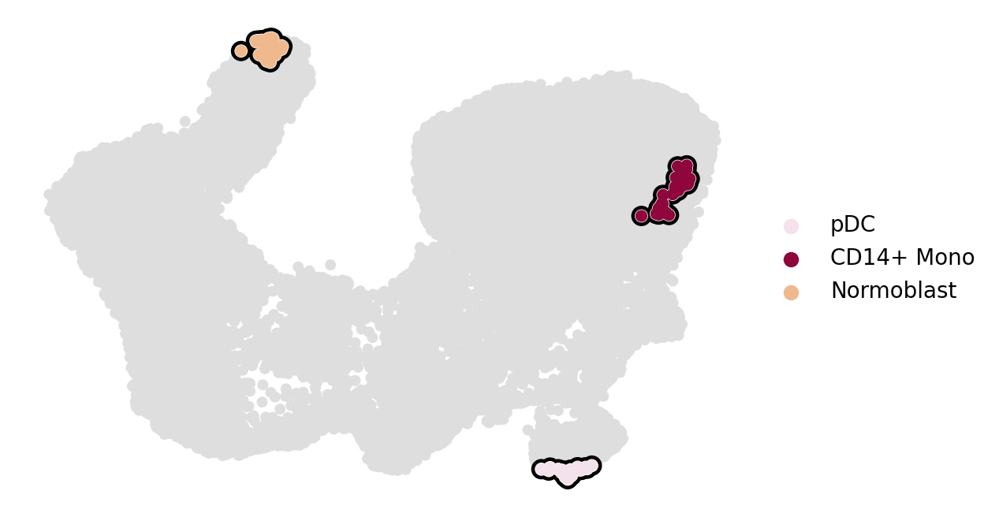

In [24]:
estimator.compute_macrostates(3, cluster_key="l2_cell_type")

if running_in_notebook():
    plot_states(
        adata,
        estimator=estimator,
        which="macrostates",
        basis="umap",
        legend_loc="right",
        title="",
        size=100,
    )

In [25]:
terminal_states = ["CD14+ Mono", "Normoblast", "cDC2", "pDC"]
cluster_key = "l2_cell_type"

if (DATA_DIR / "hematopoiesis" / "results" / "tsi-ptk.csv").is_file():
    tsi_df = pd.read_csv(DATA_DIR / "hematopoiesis" / "results" / "tsi-ptk.csv")
    estimator._tsi = AnnData(tsi_df, uns={"terminal_states": terminal_states, "cluster_key": cluster_key})
    tsi_score = estimator.tsi(n_macrostates=7, terminal_states=terminal_states, cluster_key=cluster_key)
else:
    tsi_score = estimator.tsi(n_macrostates=7, terminal_states=terminal_states, cluster_key=cluster_key)
    estimator._tsi.to_df().to_csv(DATA_DIR / "hematopoiesis" / "results" / "tsi-ptk.csv", index=False)

print(f"TSI score: {tsi_score:.2f}")

TSI score: 0.91


/vol/storage/miniconda3/envs/cr2-py38/lib/python3.8/site-packages/anndata/_core/anndata.py:121: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


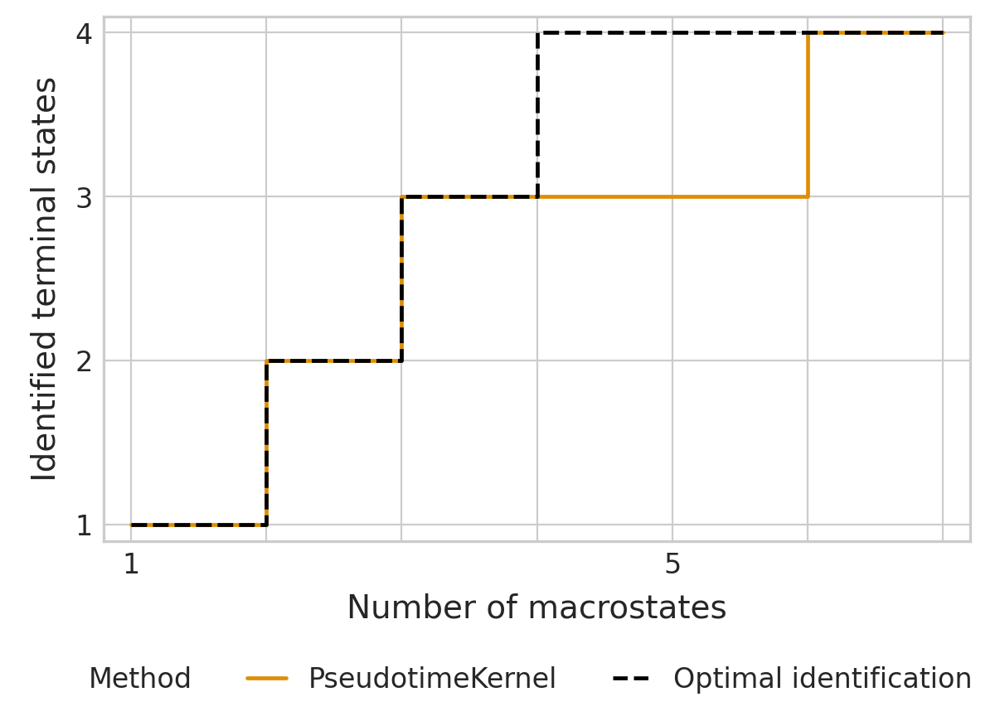

In [26]:
palette = {"PseudotimeKernel": "#DE8F05", "Optimal identification": "#000000"}

if SAVE_FIGURES:
    fname = FIG_DIR / "pseudotime_kernel" / "hematopoiesis" / f"tsi-dpt.{FIGURE_FORMAT}"
else:
    fname = None

with mplscience.style_context():
    sns.set_style(style="whitegrid")
    estimator.plot_tsi(palette=palette, save=fname)
    plt.show()

Computing `6` macrostates
DEBUG: Setting the macrostates using macrostates memberships
DEBUG: Raising an exception if there are less than `6` cells.
Adding `.macrostates`
       `.macrostates_memberships`
       `.coarse_T`
       `.coarse_initial_distribution
       `.coarse_stationary_distribution`
       `.schur_vectors`
       `.schur_matrix`
       `.eigendecomposition`
    Finish (0:00:05)


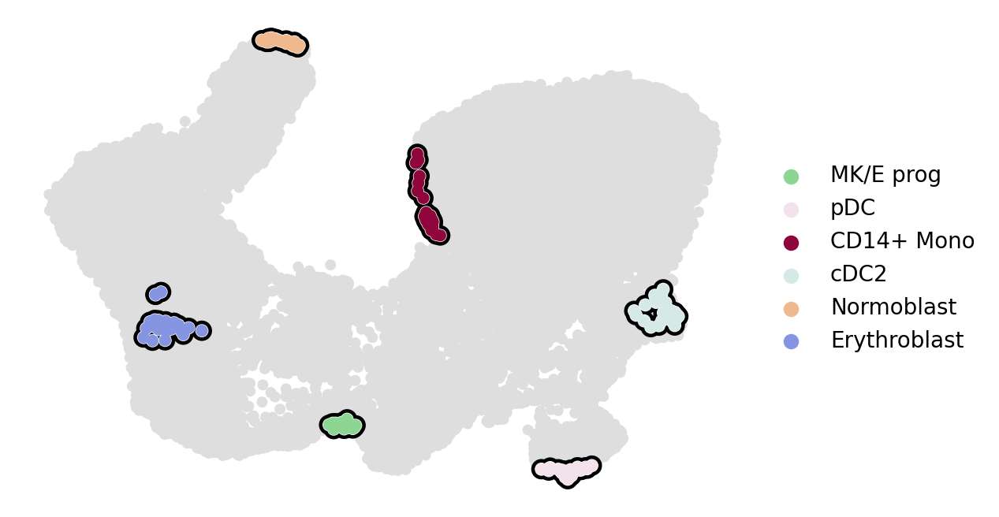

In [27]:
estimator.compute_macrostates(6, cluster_key="l2_cell_type")

if running_in_notebook():
    plot_states(
        adata,
        estimator=estimator,
        which="macrostates",
        basis="umap",
        legend_loc="right",
        title="",
        size=100,
    )

if SAVE_FIGURES:
    fpath = FIG_DIR / "pseudotime_kernel" / "hematopoiesis" / "umap_colored_by_cr_dpt_macrostates.pdf"
    plot_states(
        adata,
        estimator=estimator,
        which="macrostates",
        basis="umap",
        legend_loc=False,
        title="",
        size=100,
        fpath=fpath,
        format="pdf",
    )

Mean purity: 0.8888888888888888


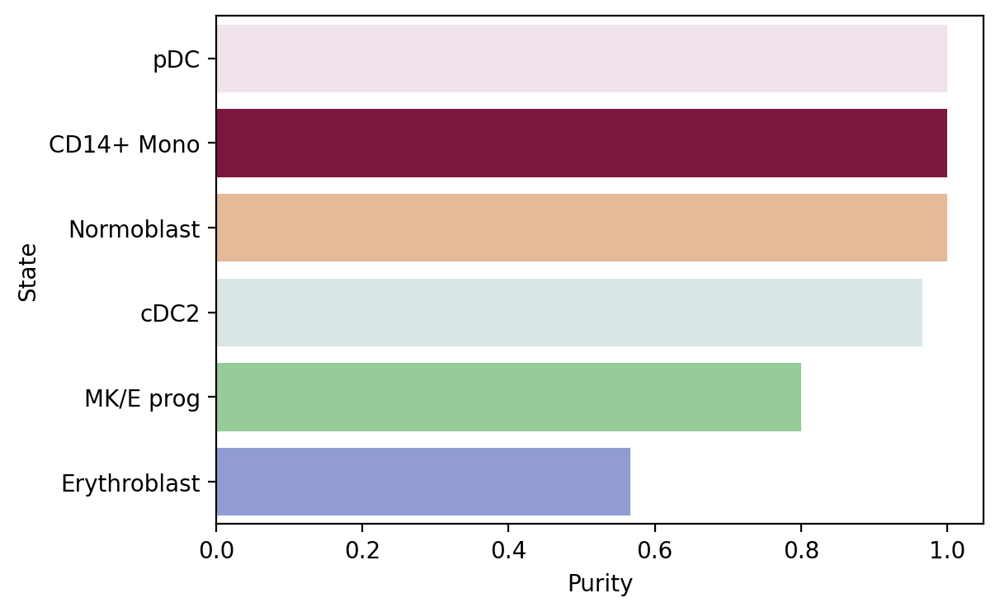

In [28]:
macrostate_purity = get_state_purity(adata, estimator, states="macrostates", obs_col="l2_cell_type")
print(f"Mean purity: {np.mean(list(macrostate_purity.values()))}")

if running_in_notebook():
    if SAVE_FIGURES:
        fpath = FIG_DIR / "pseudotime_kernel" / "hematopoiesis" / "dpt_macrostate_purity.pdf"
    else:
        fpath = None

    palette = dict(zip(estimator.macrostates.cat.categories, estimator._macrostates.colors))

    plot_state_purity(macrostate_purity, palette=palette, fpath=fpath, format="eps")
    plt.show()

DEBUG: Raising an exception if there are less than `6` cells.
Adding `adata.obs['term_states_fwd']`
       `adata.obs['term_states_fwd_probs']`
       `.terminal_states`
       `.terminal_states_probabilities`
       `.terminal_states_memberships
    Finish`


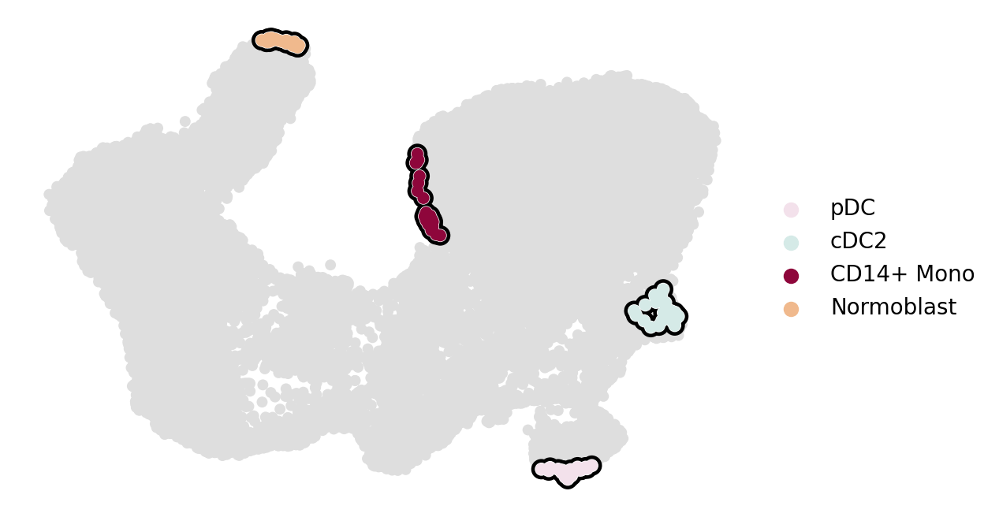

In [29]:
estimator.set_terminal_states(["pDC", "cDC2", "CD14+ Mono", "Normoblast"])

if running_in_notebook():
    plot_states(
        adata,
        estimator=estimator,
        which="terminal_states",
        basis="umap",
        legend_loc="right",
        title="",
        size=100,
        fpath=fpath,
        format="pdf",
    )

if SAVE_FIGURES:
    fpath = FIG_DIR / "pseudotime_kernel" / "hematopoiesis" / "umap_colored_by_cr_dpt_terminal_states.pdf"
    plot_states(
        adata,
        estimator=estimator,
        which="terminal_states",
        basis="umap",
        legend_loc=False,
        title="",
        size=100,
        fpath=fpath,
        format="pdf",
    )

Mean purity: 0.8888888888888888


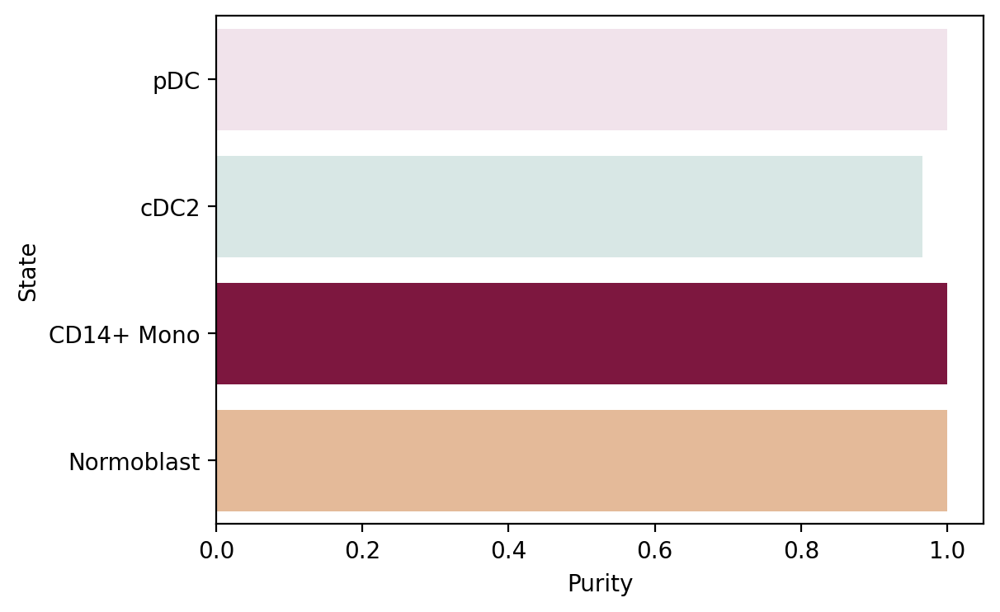

In [30]:
terminal_state_purity = get_state_purity(adata, estimator, states="terminal_states", obs_col="l2_cell_type")
print(f"Mean purity: {np.mean(list(macrostate_purity.values()))}")

if running_in_notebook():
    if SAVE_FIGURES:
        fpath = FIG_DIR / "pseudotime_kernel" / "hematopoiesis" / "dpt_terminal_states_purity.pdf"
    else:
        fpath = None

    palette = dict(zip(estimator.terminal_states.cat.categories, estimator._term_states.colors))

    plot_state_purity(
        terminal_state_purity,
        palette=palette,
        order=["pDC", "cDC2", "CD14+ Mono", "Normoblast"],
        fpath=fpath,
        format="eps",
    )
    plt.show()

Computing fate probabilities
DEBUG: Solving the linear system using `PETSc` solver `'gmres'` on `1` core(s) with no preconditioner and `tol=1e-07`


  0%|          | 0/4 [00:00<?, ?/s]

Adding `adata.obsm['lineages_fwd']`
       `.fate_probabilities`
    Finish (0:00:00)


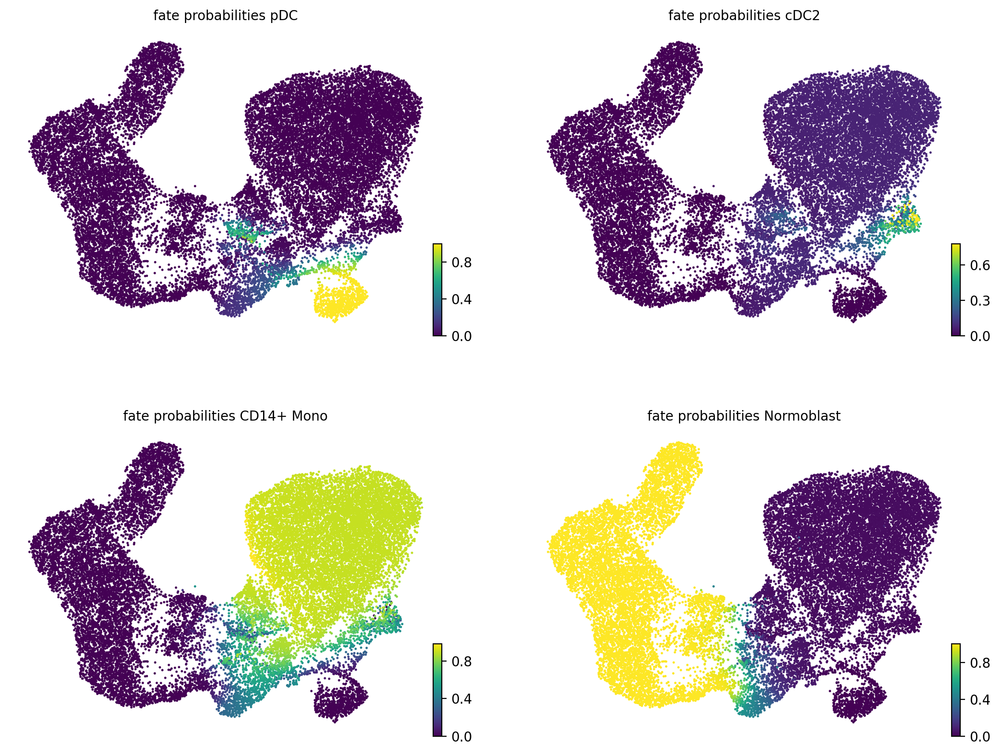

In [31]:
estimator.compute_fate_probabilities(tol=1e-7)
if running_in_notebook():
    estimator.plot_fate_probabilities(same_plot=False, basis="umap", ncols=2)

if SAVE_FIGURES:
    adata.obs["fate_prob_pDC"] = adata.obsm["lineages_fwd"][:, "pDC"].X.squeeze()
    adata.obs["fate_prob_cDC2"] = adata.obsm["lineages_fwd"][:, "cDC2"].X.squeeze()
    adata.obs["fate_prob_CD14+Mono"] = adata.obsm["lineages_fwd"][:, "CD14+ Mono"].X.squeeze()
    adata.obs["fate_prob_Normoblast"] = adata.obsm["lineages_fwd"][:, "Normoblast"].X.squeeze()

    for terminal_state in ["pDC", "cDC2", "CD14+Mono", "Normoblast"]:
        fig, ax = plt.subplots(figsize=(6, 4))

        if running_in_notebook():
            scv.pl.scatter(
                adata,
                basis="umap",
                color=f"fate_prob_{terminal_state}",
                cmap="viridis",
                title="",
                colorbar=False,
                ax=ax,
            )

            fig.savefig(
                FIG_DIR / "pseudotime_kernel" / "hematopoiesis" / f"dpt_fate_prob_{terminal_state}.eps",
                format="eps",
                transparent=True,
                bbox_inches="tight",
            )

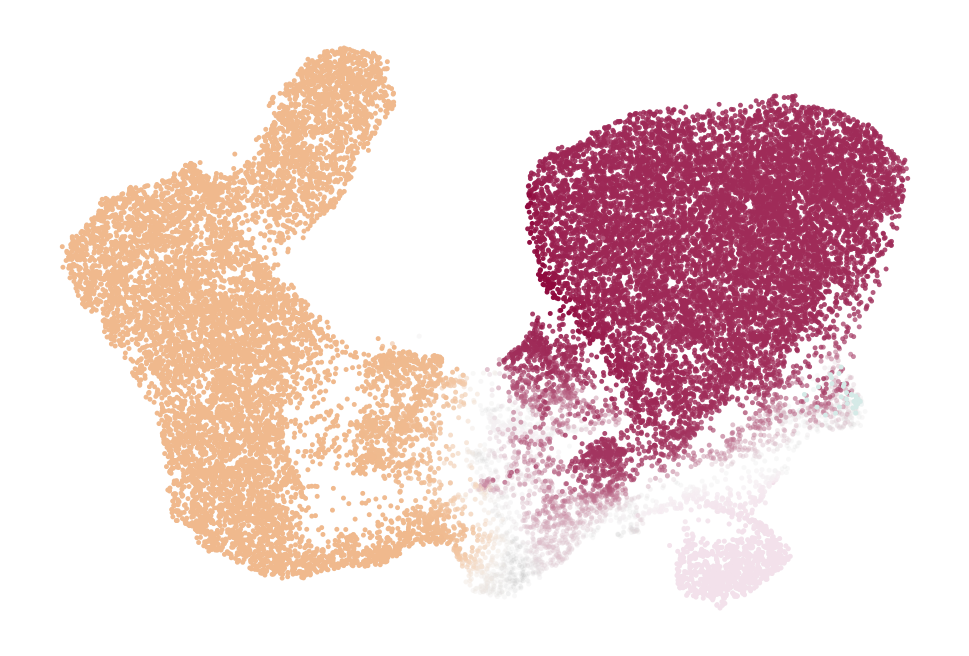

In [32]:
if running_in_notebook():
    if SAVE_FIGURES:
        fname = f"{FIG_DIR}/pseudotime_kernel/hematopoiesis/umap_colored_by_dpt_fate.pdf"
    else:
        fname = False
    fig, ax = plt.subplots(figsize=(6, 4))
    estimator.plot_fate_probabilities(
        same_plot=True,
        basis="umap",
        title="",
        legend_loc=False,
        save=fname,
        ax=ax,
    )

## Driver analysis

DEBUG: Computing correlations for lineages `['pDC']` restricted to clusters `['HSC', 'pDC']` in layer `X` with `use_raw=False`
Adding `adata.varm['terminal_lineage_drivers']`
       `.lineage_drivers`
    Finish (0:00:00)


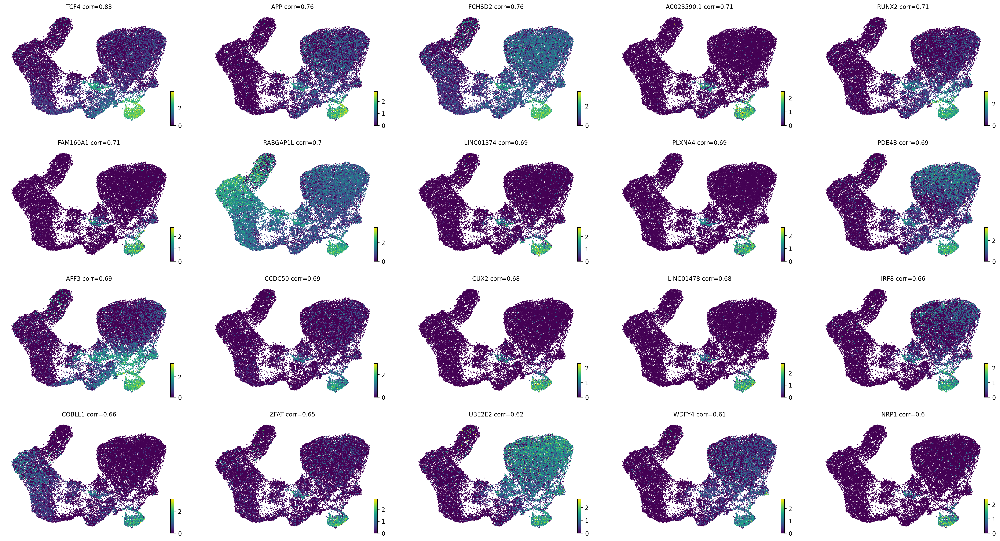

In [33]:
drivers = estimator.compute_lineage_drivers(
    return_drivers=True, cluster_key="l2_cell_type", lineages=["pDC"], clusters=["HSC", "pDC"]
)

if running_in_notebook():
    estimator.plot_lineage_drivers(lineage="pDC", n_genes=20, ncols=5, title_fmt="{gene} corr={corr:.2}")
    plt.show()

Computing trends using `1` core(s)


  0%|          | 0/1 [00:00<?, ?gene/s]

    Finish (0:00:00)
Plotting trends
DEBUG: Key `None` not found in `adata.obs` or `adata.var_names`. Ignoring`
DEBUG: Key `None` not found in `adata.obs` or `adata.var_names`. Ignoring`
DEBUG: Key `None` not found in `adata.obs` or `adata.var_names`. Ignoring`
DEBUG: Key `None` not found in `adata.obs` or `adata.var_names`. Ignoring`
DEBUG: Key `None` not found in `adata.obs` or `adata.var_names`. Ignoring`


[0]PETSC ERROR: ------------------------------------------------------------------------
[0]PETSC ERROR: Caught signal number 13 Broken Pipe: Likely while reading or writing to a socket
[0]PETSC ERROR: Try option -start_in_debugger or -on_error_attach_debugger
[0]PETSC ERROR: or see https://petsc.org/release/faq/#valgrind and https://petsc.org/release/faq/
[0]PETSC ERROR: configure using --with-debugging=yes, recompile, link, and run 
[0]PETSC ERROR: to get more information on the crash.
Abort(59) on node 0 (rank 0 in comm 0): application called MPI_Abort(MPI_COMM_WORLD, 59) - process 0


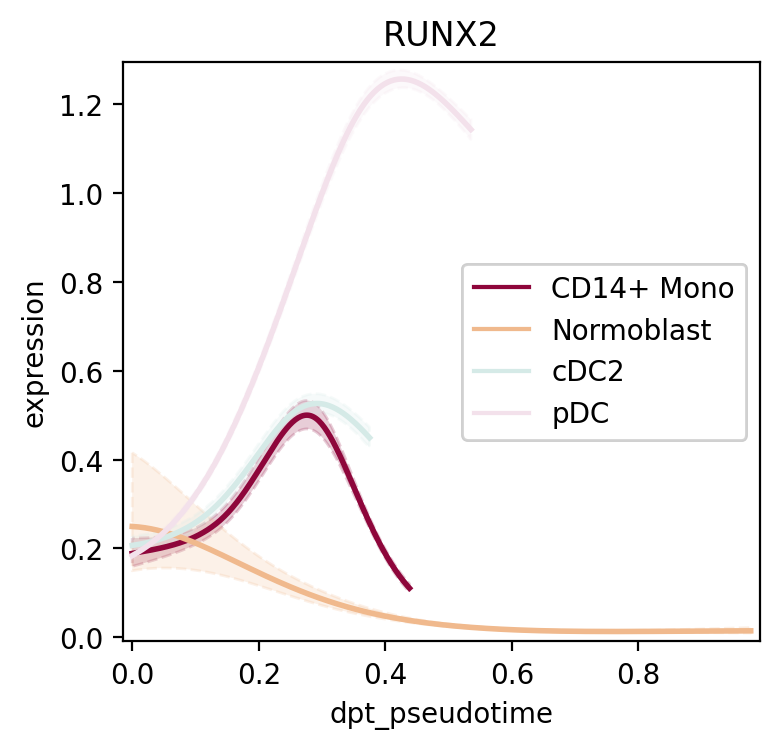

Computing trends using `1` core(s)


  0%|          | 0/1 [00:00<?, ?gene/s]

    Finish (0:00:01)
Plotting trends
DEBUG: Key `None` not found in `adata.obs` or `adata.var_names`. Ignoring`
DEBUG: Key `None` not found in `adata.obs` or `adata.var_names`. Ignoring`
DEBUG: Key `None` not found in `adata.obs` or `adata.var_names`. Ignoring`
DEBUG: Key `None` not found in `adata.obs` or `adata.var_names`. Ignoring`
DEBUG: Key `None` not found in `adata.obs` or `adata.var_names`. Ignoring`


[0]PETSC ERROR: ------------------------------------------------------------------------
[0]PETSC ERROR: Caught signal number 13 Broken Pipe: Likely while reading or writing to a socket
[0]PETSC ERROR: Try option -start_in_debugger or -on_error_attach_debugger
[0]PETSC ERROR: or see https://petsc.org/release/faq/#valgrind and https://petsc.org/release/faq/
[0]PETSC ERROR: configure using --with-debugging=yes, recompile, link, and run 
[0]PETSC ERROR: to get more information on the crash.
Abort(59) on node 0 (rank 0 in comm 0): application called MPI_Abort(MPI_COMM_WORLD, 59) - process 0


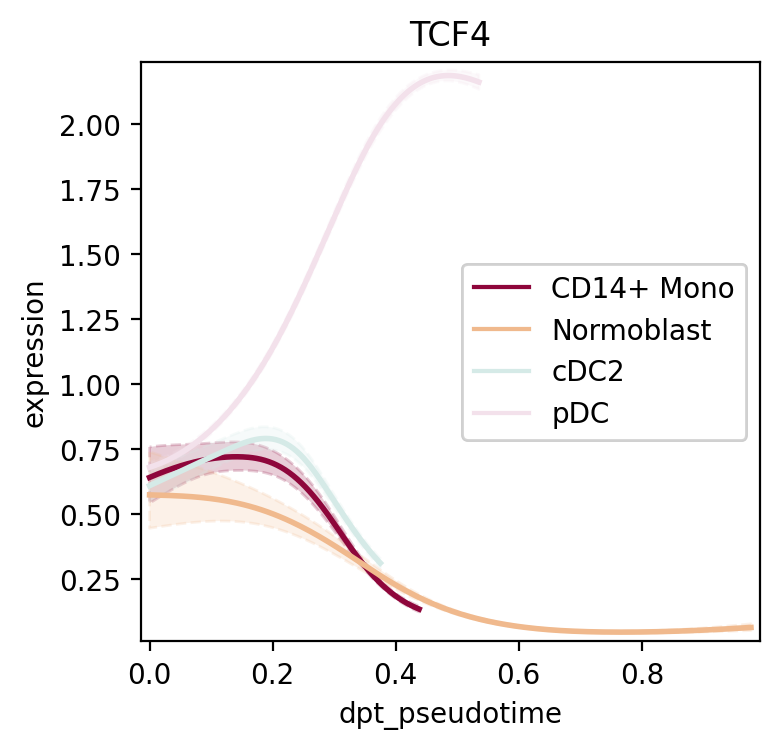

In [34]:
model = cr.models.GAM(adata)

if SAVE_FIGURES:
    save = FIG_DIR / "pseudotime_kernel" / "hematopoiesis" / "gene_trend_runx2.pdf"
else:
    save = None
cr.pl.gene_trends(
    adata,
    model=model,
    genes="RUNX2",
    time_key="dpt_pseudotime",
    hide_cells=True,
    same_plot=True,
    lineage_cmap=["#8e063b", "#f0b98d", "#d5eae7", "#f3e1eb"],
    figsize=(4, 4),
    save=save,
)
plt.show()


if SAVE_FIGURES:
    save = FIG_DIR / "pseudotime_kernel" / "hematopoiesis" / "gene_trend_tcf4.pdf"
else:
    save = None
cr.pl.gene_trends(
    adata,
    model=model,
    genes="TCF4",
    time_key="dpt_pseudotime",
    hide_cells=True,
    same_plot=True,
    lineage_cmap=["#8e063b", "#f0b98d", "#d5eae7", "#f3e1eb"],
    figsize=(4, 4),
    save=save,
)
plt.show()